Imports

In [1]:
# conda install seaborn

In [2]:
# conda install -c conda-forge folium 

In [1]:
from zipfile import ZipFile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import HeatMap
from wordcloud import WordCloud, ImageColorGenerator
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

In [4]:
# multiple files present in the .zip file
# using zipfile
filename = 'archive.zip'

# opening zip file in read mode
with ZipFile(filename, 'r') as zip:
    # reading the contents of the zip file
    print('Reading contents...')
    zip.printdir()
    # Extract the contents 
    print("Extracting ...")
    zip.extractall()
    print("Done!")

Reading contents...
File Name                                             Modified             Size
AB_NYC_2019.csv                                2019-10-27 22:06:18      7077973
New_York_City_.png                             2019-10-27 22:06:20       192340
Extracting ...
Done!


In [5]:
# getting the dataset set (.csv)
path = 'AB_NYC_2019.csv'
df = pd.read_csv(path)
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [6]:
# inspecting the shape of the dataframe
print(f"Rows: {df.shape[0]}")
print(f"Cols: {df.shape[1]}")
print(f"Features:\n {df.columns.to_list()}\n")
print(f"Missing values: {df.isna().values.sum()}")
print(f"Unique values:\n {df.nunique()}\n")

Rows: 48895
Cols: 16
Features:
 ['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

Missing values: 20141
Unique values:
 id                                48895
name                              47905
host_id                           37457
host_name                         11452
neighbourhood_group                   5
neighbourhood                       221
latitude                          19048
longitude                         14718
room_type                             3
price                               674
minimum_nights                      109
number_of_reviews                   394
last_review                        1764
reviews_per_month                   937
calculated_host_listings_count       47
availability_365                    366
dtype: int64



In [7]:
# looking at the data types and non empty counts

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [8]:
# last_review and number_of_reviews column have significantly 
# more missing values compared to others
# Not everyone leaves reviews
# Months where the location was not occupied would have no reviews
df_null_count = df.isna().sum(axis=0)
df_null_count

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [9]:
# count and percentage of missing value
# ~ 20% of the data is missing in the last_review and reviews_per_month columns
total = df.isna().sum().sort_values(ascending=False)
percent = (((df.isnull().sum())*100)/df.shape[0]).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
last_review,10052,20.558339
reviews_per_month,10052,20.558339
host_name,21,0.042949
name,16,0.032723
id,0,0.000000
host_id,0,0.000000
neighbourhood_group,0,0.000000
neighbourhood,0,0.000000
latitude,0,0.000000
longitude,0,0.000000


In [10]:
# null features
var_with_null = [var for var in df.columns if df[var].isna().sum() > 1]

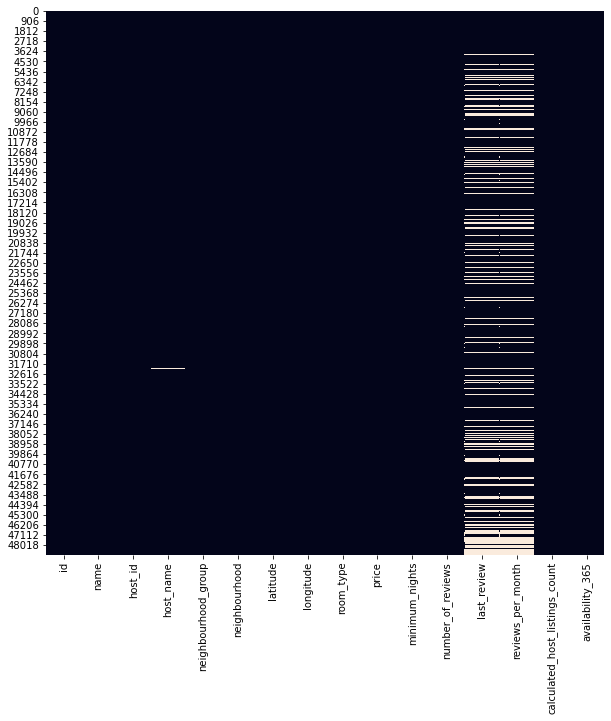

In [11]:
## Visualizing the missing values 
# visual makes it easier to see where the distribution of missing values
plt.figure(figsize=(10, 10))
sns.heatmap(df.isna(), cbar=False);

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,48895.0,1.901714e+07,1.098311e+07,2539.00000,9.471945e+06,1.967728e+07,2.915218e+07,3.648724e+07
host_id,48895.0,6.762001e+07,7.861097e+07,2438.00000,7.822033e+06,3.079382e+07,1.074344e+08,2.743213e+08
latitude,48895.0,4.072895e+01,5.453008e-02,40.49979,4.069010e+01,4.072307e+01,4.076311e+01,4.091306e+01
longitude,48895.0,-7.395217e+01,4.615674e-02,-74.24442,-7.398307e+01,-7.395568e+01,-7.393627e+01,-7.371299e+01
price,48895.0,1.527207e+02,2.401542e+02,0.00000,6.900000e+01,1.060000e+02,1.750000e+02,1.000000e+04
minimum_nights,48895.0,7.029962e+00,2.051055e+01,1.00000,1.000000e+00,3.000000e+00,5.000000e+00,1.250000e+03
number_of_reviews,48895.0,2.327447e+01,4.455058e+01,0.00000,1.000000e+00,5.000000e+00,2.400000e+01,6.290000e+02
reviews_per_month,38843.0,1.373221e+00,1.680442e+00,0.01000,1.900000e-01,7.200000e-01,2.020000e+00,5.850000e+01
calculated_host_listings_count,48895.0,7.143982e+00,3.295252e+01,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,3.270000e+02
availability_365,48895.0,1.127813e+02,1.316223e+02,0.00000,0.000000e+00,4.500000e+01,2.270000e+02,3.650000e+02


Few interesting observations from the data:
- On average the places are booked for little over 7 days. People prefer longer stays. 
- Highest price for one night is \$10000. 
- Maximum number of nights stayed is 1250.
- Average price of the places is $152

In [13]:
# features correlation
df.corr().style.background_gradient(cmap='coolwarm')

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.588290,-0.003125,0.090908,0.010619,-0.013224,-0.319760,0.291828,0.133272,0.085468
host_id,0.588290,1.000000,0.020224,0.127055,0.015309,-0.017364,-0.140106,0.296417,0.154950,0.203492
latitude,-0.003125,0.020224,1.000000,0.084788,0.033939,0.024869,-0.015389,-0.010142,0.019517,-0.010983
longitude,0.090908,0.127055,0.084788,1.000000,-0.150019,-0.062747,0.059094,0.145948,-0.114713,0.082731
price,0.010619,0.015309,0.033939,-0.150019,1.000000,0.042799,-0.047954,-0.030608,0.057472,0.081829
minimum_nights,-0.013224,-0.017364,0.024869,-0.062747,0.042799,1.000000,-0.080116,-0.121702,0.127960,0.144303
number_of_reviews,-0.319760,-0.140106,-0.015389,0.059094,-0.047954,-0.080116,1.000000,0.549868,-0.072376,0.172028
reviews_per_month,0.291828,0.296417,-0.010142,0.145948,-0.030608,-0.121702,0.549868,1.000000,-0.009421,0.185791
calculated_host_listings_count,0.133272,0.154950,0.019517,-0.114713,0.057472,0.127960,-0.072376,-0.009421,1.000000,0.225701
availability_365,0.085468,0.203492,-0.010983,0.082731,0.081829,0.144303,0.172028,0.185791,0.225701,1.000000


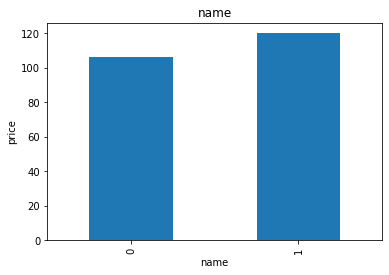

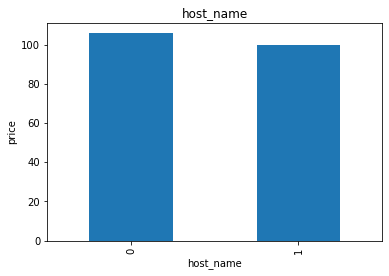

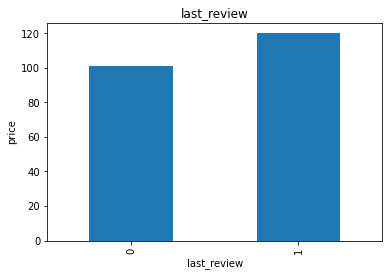

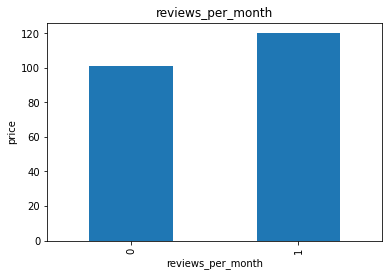

In [14]:
# plotting the realtionship between missing values and the outcome value (price)

def analyse_null_value(df, var):
    df = df.copy()
    
    # create a column with 1 where values are missing, 0 otherwise
    df[var]=np.where(df[var].isna(), 1, 0)
    
    # calculate mean saleprice where the data is missing and compare that with 
    # where data is not missing 
    df.groupby(var)['price'].median().plot.bar()
    plt.title(var)
    plt.ylabel('price')
    plt.show()
    
for var in var_with_null:
    analyse_null_value(df, var)
    

Outcome variable which is the price is slightly higher where the value is missing compared to the rows where the values are not missing. 

#### Exploring the features

neighbourhood group

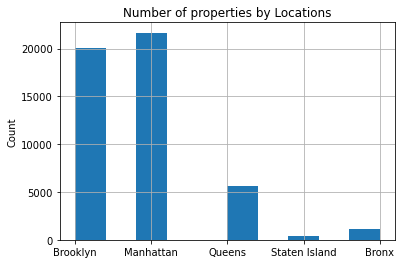

In [15]:
# Plotting a histogram
# manhattan and brooklyn have the highest no of locations

df.neighbourhood_group.hist()
plt.ylabel('Count')
plt.title('Number of properties by Locations')
plt.show()

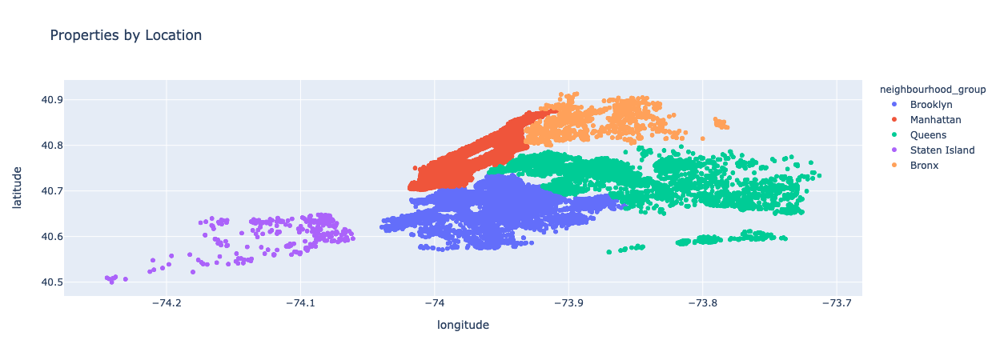

In [16]:
# distribution of the locations by lat long

fig = px.scatter(df, x="longitude", y="latitude", color="neighbourhood_group", title="Properties by Location")
fig.show()

Queens appears to he high as well and easy to confude that it is in comparison with manhattan.

Manhattan has more density which is reflected by the histogram above.

Folium library allows us to visualize over the geographical location

In [17]:
# desnity of the locations overlayed on the map

map = folium.Map([40.7128, -74.0060], zoom_start=11)
HeatMap(df[['latitude', 'longitude']].dropna(), radius=8, gradient={0.2:'blue', 0.4:'purple',0.6:'orange',1.0:'red'}).add_to(map)
display(map)

High density areas are marked in red while low density areas are marked in blue

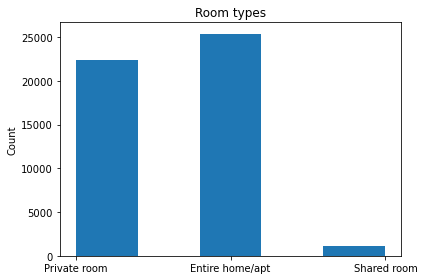

In [18]:
# types of rooms offered.
# Shared rooms are not very popular

plt.hist(df.room_type, bins=5)
plt.title('Room types')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

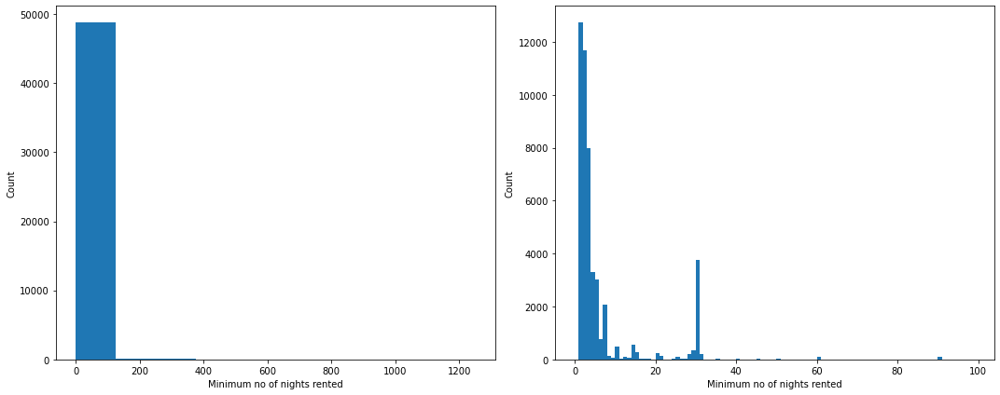

In [19]:
# Minimum number of nights rented is expected to be on the lower side so no surprises there

fig,axes = plt.subplots(1, 2, figsize=(15,6), sharey=False)
axes[0].hist(df.minimum_nights)
axes[1].hist(df.minimum_nights, bins=np.arange(100))
axes[0].set_xlabel("Minimum no of nights rented")
axes[0].set_ylabel("Count")
axes[1].set_xlabel("Minimum no of nights rented")
axes[1].set_ylabel("Count")
plt.tight_layout()

plt.show()

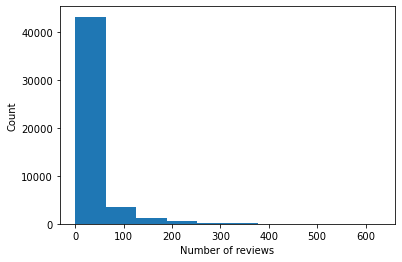

In [20]:
# number of reviews

plt.hist(df.number_of_reviews)
plt.xlabel('Number of reviews')
plt.ylabel("Count")
plt.show()

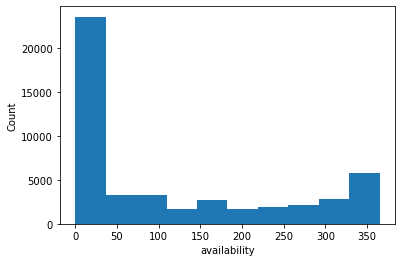

In [21]:
# availability
# Lots of places with availability less tha 50 days.
# Sign that private homeowners are renting out their homes
# Assumption that hotels have commercial rentals have 50+ days availability

plt.hist(df.availability_365)
plt.xlabel("availability")
plt.ylabel("Count")
plt.show()

Looking at the price (outcome variable)

In [22]:
def price_split(price):
    "Splitting prices into low, medium and high"
    if 75 < price < 500:
        return "medium"
    elif price < 75:
        return "low"
    else:
        return "high"

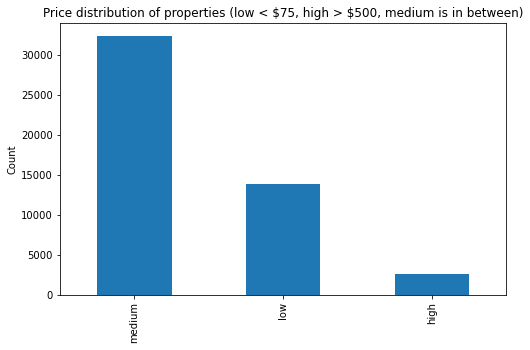

In [23]:
# price
plt.figure(figsize=(8,5))
df["price"].apply(price_split).value_counts().plot(kind='bar')
plt.title("Price distribution of properties (low < \$75, high > \$500, medium is in between)")
plt.ylabel("Count")
plt.show()

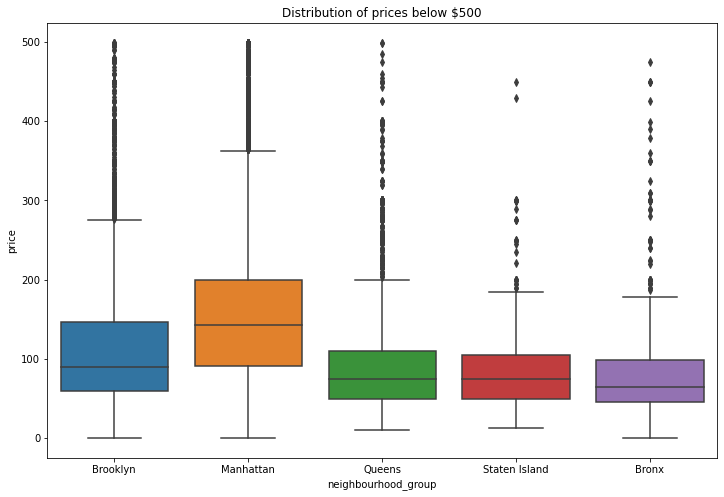

In [24]:
# relationship between neghbourhood and price
# let's chop off the outrageous prices

plt.figure(figsize=(12, 8))
df_price_below_500 = df[df.price < 500]
sns.boxplot(x='neighbourhood_group', y="price", data=df_price_below_500)
plt.title("Distribution of prices below $500")
plt.show()

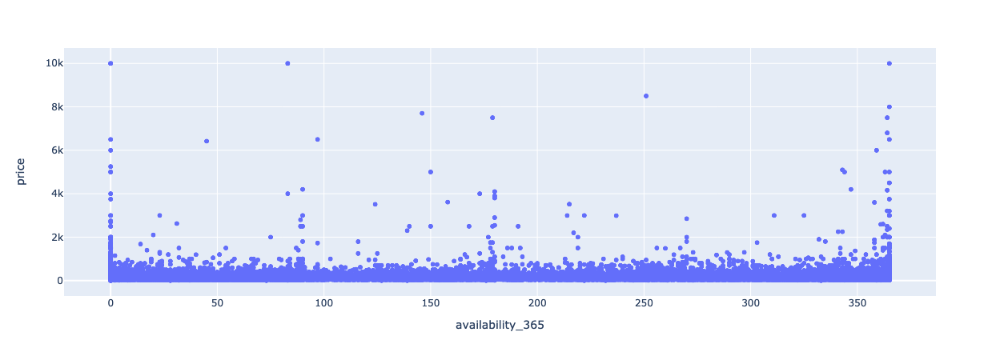

In [25]:
# Doesn't look like there is much of a relationship between availability and the price tag

fig = px.scatter(df, x="availability_365", y="price")
fig.show()

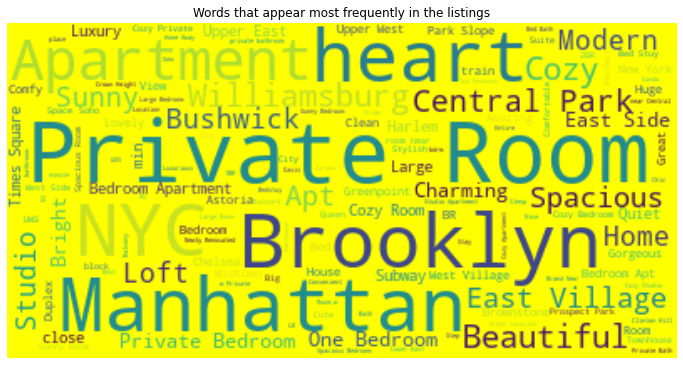

In [26]:
# Looking at the discription of the locations 

text  = " ".join(str(description) for description in df.name)

# create and generate world cloud

wordcloud = WordCloud(max_words=200, background_color='yellow').generate(text)
plt.figure(figsize=(12,8))

# display image 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Words that appear most frequently in the listings")
plt.show()

Data Preprocessing

In [27]:
# Dropping the features that are insignificant
# feature 'reviews_per_month' has nan values which we will
# replace with 0.

X = df.copy()
X.drop(columns=['id', "name", 'host_id', 'host_name', 'last_review'], inplace=True, axis=1)
X['reviews_per_month'] = X['reviews_per_month'].replace(np.nan, 0)

In [28]:
## Checking to see if there are any missing values

X.isna().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [29]:
# seperating the data to target variable

y = df['price']
X.drop(labels='price', axis=1, inplace=True);

In [30]:
# handling the categorical variables

X = pd.get_dummies(X, drop_first=True)
X.shape

(48895, 233)

Splitting the dataset into training, validation and test set

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1,)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1)

In [32]:
print(f"Size of train set: {X_train.shape, y_train.shape}")
print(f"Size of validation set: {X_val.shape, y_val.shape}")
print(f"Size of test set: {X_test.shape, y_test.shape}")
      

Size of train set: ((39604, 233), (39604,))
Size of validation set: ((4401, 233), (4401,))
Size of test set: ((4890, 233), (4890,))


### Starting with a Bayesian model

Using 1 holdout set for validation

In [41]:
from sklearn.linear_model import BayesianRidge

In [42]:
bayes_model = BayesianRidge()

In [43]:
bayes_model.fit(X_train, y_train)

BayesianRidge()

In [44]:
# checking the model performance in the training set
print(f"Bayes ridge regressor R2 score on training set: {bayes_model.score(X_train, y_train):.2f}")

Bayes ridge regressor R2 score on training set: 0.11


In [45]:
## checking the model on the validation set 
print(f"Bayes ridge regressor R2 score on validation set: {bayes_model.score(X_val, y_val):.2f}")

Bayes ridge regressor R2 score on validation set: 0.19


In [46]:
# A few examples 
y_val[20:25]

14700    185
22024    122
2096     115
35653     28
43691    120
Name: price, dtype: int64

In [47]:
bayes_model.predict(X_val[20:25])

array([210.74366428, 165.45743362, 175.71046335,  37.06141277,
       227.71221565])

#### Decision Tree

Let's look at decision tree

In [48]:
from sklearn.tree import DecisionTreeRegressor

tree = DecisionTreeRegressor()
tree.fit(X_train, y_train)
train_set_score = tree.score(X_train, y_train)
val_set_score = tree.score(X_val, y_val)
print(f"Training set R2 score of decision tree is {train_set_score:.2f} and validation set R2 score is {val_set_score:.2f}")

Training set R2 score of decision tree is 1.00 and validation set R2 score is -1.30


In [49]:
# Let's look at some predictions
print(f"True values: {y_val[50:55].values}")
print(f"Predictions by decision tree: {tree.predict(X_val[50:55])}")

True values: [110 105  40 900 160]
Predictions by decision tree: [148.  40.  45. 349. 140.]


#### RandomForest Regressor

In [50]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor()
rf.fit(X_train, y_train)
rf_train_score = rf.score(X_train, y_train)
rf_val_score = rf.score(X_val, y_val)
print(f"Training set R2 score of RandomForest model is {rf_train_score:.2f} and validation set R2 score is {rf_val_score:.2f}")

Training set R2 score of RandomForest model is 0.87 and validation set R2 score is 0.22


In [51]:
# Let's look at some predictions
print(f"True values: {y_val[50:55].values}")
print(f"Predictions by Random Forest: {rf.predict(X_val[50:55])}")

True values: [110 105  40 900 160]
Predictions by Random Forest: [131.22 177.55  69.39 242.88 141.61]


Quite high overfitting on the training set with RandomForest. 

Performance on the validation set is on par with the Bayesian model. A lot better than the decision tree which is expected.

#### Gradient Boosting

In [52]:
from sklearn.ensemble import GradientBoostingRegressor

gb = GradientBoostingRegressor()
gb.fit(X_train, y_train)
gb_train_score = gb.score(X_train, y_train)
gb_val_score = gb.score(X_val, y_val)
print(f"Training set R2 score of Gradient Boosting is {gb_train_score:.2f} and validation set R2 score is {gb_val_score:.2f}")

Training set R2 score of Gradient Boosting is 0.29 and validation set R2 score is 0.27


In [53]:
# Let's look at some predictions
print(f"True values: {y_val[50:55].values}")
print(f"Predictions by Gradient Boosting: {np.round(gb.predict(X_val[50:55]))}")

True values: [110 105  40 900 160]
Predictions by Gradient Boosting: [144. 219.  76. 233. 203.]


Not as extreme overfitting on the training set and the RandomForest but there is still some overfitting.

Validation set score is best yet.

#### XGBoost

In [78]:
# conda install -c conda-forge xgboost 

In [33]:
from sklearn.metrics import r2_score
from time import time

In [72]:
# trimming down the dataset size because the training time is quite long on the original training set
# Using half of the training set

# X_train_short = X_train.iloc[:20000, :]
# y_train_short = y_train[:20000]
# X_train_short.shape, y_train_short.shape

((20000, 233), (20000,))

In [34]:
import xgboost as xgb

In [55]:
mod = xgb.XGBRegressor(
    gamma=1,                 
    learning_rate=0.01,
    max_depth=3,
    n_estimators=10000,                                                                    
    subsample=0.8,
    random_state=34,
    verbosity=1,
    n_jobs=-1
) 

## Keeping track of time for xgboost
start_time = time()
mod.fit(X_train, y_train)
end_time = time()

In [56]:
time_elapsed = end_time - start_time
time_in_min = (time_elapsed / 60)
print(f"Time to train XGBoost: {time_in_min:.2f} mins")

Time to train XGBoost: 35.86 mins


In [57]:
xg_train_score = r2_score(y_train, mod.predict(X_train))
xg_val_score = r2_score(y_val, mod.predict(X_val))
print(f"Training set R2 score of XGBoost is {xg_train_score:.2f} and validation set R2 score is {xg_val_score:.2f}")

Training set R2 score of XGBoost is 0.58 and validation set R2 score is -0.04


In [58]:
xg_test_score = r2_score(y_test, mod.predict(X_test))
print(f"Test set R2 score of XGBoost is {xg_test_score:.2f}")

Test set R2 score of XGBoost is -0.03


Quite a bit of overfitting on the training set.

Performance is better than Gradient Boosting but the time to train was ~37 minutes on [40000X233] shape dataset

## Tuning Gradient Boosting

Let's see if we can improve GradientBoosting Regressor

In [56]:
from sklearn.model_selection import GridSearchCV

# out of the box regressor
clf = GradientBoostingRegressor()

## choosing different set of hyper-parameters
param_grid = {'n_estimators':[500,1000,2000],
              'learning_rate':[.001,0.01,.1],
              'max_depth':[1,2,4],
              'subsample':[.5,.75,1],
              'random_state':[1]}

gs = GridSearchCV(estimator=clf,
                  param_grid=param_grid,
                  refit=True,
                  cv=10,
                  n_jobs=-1)

gs.fit(X_train, y_train)

print(f"Best Accuracy: {gs.best_score_*100}%")
print(f"Best Params: {gs.best_params_}")

Best Accuracy: 14.58061649444756%
Best Params: {'learning_rate': 0.01, 'max_depth': 2, 'n_estimators': 2000, 'random_state': 1, 'subsample': 1}


In [58]:
print(f"Best Accuracy: {gs.best_score_*100:.2f}%")
print(f"Best Params: {gs.best_params_}")

Best Accuracy: 14.58%
Best Params: {'learning_rate': 0.01, 'max_depth': 2, 'n_estimators': 2000, 'random_state': 1, 'subsample': 1}


In [60]:
# gs.cv_results_

In [70]:
## Score on the test set from the best gradient boosting estimator

gs.best_estimator_.score(X_test, y_test)

0.13147564990737082

In [54]:
## Let's try gradient boosting again with the new parameters
gb_new = GradientBoostingRegressor(learning_rate=0.01,
                                   max_depth=2,
                                   n_estimators=2000,
                                  subsample=1)
## training the model
gb_new.fit(X_train, y_train)

# scoring the model
gb_new_train_score = gb_new.score(X_train, y_train)
gb_new_val_score = gb_new.score(X_val, y_val)
print(f"Training set R2 score of Gradient Boosting is {gb_new_train_score:.2f} and validation set R2 score is {gb_new_val_score:.2f}")

Training set R2 score of Gradient Boosting is 0.21 and validation set R2 score is 0.27
